## Lab 5: Q-Vectors
In this week's lab, we will be creating Q-Vector analyses to supplement Lab 5.  

<br />

### Useful Documentation
1. Xarray open_dataset:  https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html
2. Matplotlib Contour: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html
3. Matplotlib Quiver: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.quiver.html
4. Cartopy Feature: https://scitools.org.uk/cartopy/docs/latest/matplotlib/feature_interface.html
5. MetPy Units: https://unidata.github.io/MetPy/latest/tutorials/unit_tutorial.html
6. Datetime: https://docs.python.org/3/library/datetime.html
7. MetPy q_vector: https://unidata.github.io/MetPy/latest/api/generated/metpy.calc.q_vector.html
8. MetPy Divergence: https://unidata.github.io/MetPy/latest/api/generated/metpy.calc.divergence.html

<br />

### Tutorial
This week's, we wish to plot Q-Vectors and Q-Vector divergence using MetPy's q_vector and divergence functions.  This week's lab begins with a short tutorial on how to calculate and plot both the Q-Vectors and the Q-Vector divergence.

<br />

1. You are given some sample data below.  To calculate Q-Vectors, we need temperature, the u- and v-wind components, pressure, latitude, and longitude. Note: after initially defining these data as separate numpy arrays with MetPy units, the data are saved into an xarray Dataset to mimic the structure of gridded atmospheric datasets.

In [1]:
import numpy as np
from metpy.units import units
from scipy.ndimage import gaussian_filter
import xarray as xr

# Define atmospheric variables on an idealized 5x5 grid.
temperature = np.array([[273, 273, 273, 273],
                        [274, 274, 274, 274],
                        [276, 276, 276, 276],
                        [278, 278, 278, 278],
                        [279, 279, 279, 279]])

pressure = np.array([[850, 850, 850, 850],
                     [850, 850, 850, 850],
                     [850, 850, 850, 850],
                     [850, 850, 850, 850],
                     [850, 850, 850, 850]])

u_wind = np.array([[0, 2, 5, 10],
                   [0, 2, 5, 10],
                   [0, 2, 5, 10],
                   [0, 2, 5, 10],
                   [0, 2, 5, 10]])

v_wind = np.array([[-10, -10, -10, -10],
                   [-2, -2, -2, -2],
                   [0, 0, 0, 0],
                   [2, 2, 2, 2],
                   [10, 10, 10, 10]])

latitude = np.array([41.5,
                     41.25,
                     41,
                     40.75,
                     40.5])

longitude = np.array([-100,-99.75,-99.5,-99.25])

# Combine these data arrays into an xarray Dataset.
ds = xr.Dataset(
    data_vars=dict(
        temperature=(["latitude", "longitude"], temperature),
        u=(["latitude", "longitude"], u_wind),    
        v=(["latitude", "longitude"], v_wind),        
        pressure=(["latitude", "longitude"], pressure)
    ),
    coords=dict(
        longitude=(["longitude"], longitude),
        latitude=(["latitude"], latitude),
    ),
    attrs=dict(description="Idealized Data"),
)

# Assign units
ds.u.attrs = {"units" : "mps"}
ds.v.attrs = {"units" : "mps"}
ds.temperature.attrs = {"units" : "kelvin"}
ds.pressure.attrs = {"units" : "hPa"}
ds.latitude.attrs = {"units" : "degrees_north"}
ds.longitude.attrs = {"units" : "degrees_east"}

ds

<xarray.Dataset>
Dimensions:      (latitude: 5, longitude: 4)
Coordinates:
  * longitude    (longitude) float64 -100.0 -99.75 -99.5 -99.25
  * latitude     (latitude) float64 41.5 41.25 41.0 40.75 40.5
Data variables:
    temperature  (latitude, longitude) int64 273 273 273 273 ... 279 279 279 279
    u            (latitude, longitude) int64 0 2 5 10 0 2 5 ... 2 5 10 0 2 5 10
    v            (latitude, longitude) int64 -10 -10 -10 -10 -2 ... 10 10 10 10
    pressure     (latitude, longitude) int64 850 850 850 850 ... 850 850 850 850
Attributes:
    description:  Idealized Data

<br />

<br />

2. Raw Q-Vector data can be messy, with substantial mesoscale variability. To emphasize synoptic-scale features, however, we want to smooth the data. Since the vectors' angles are important, however, we need to smooth our data before we calculate the Q-Vectors.  The code below applies a Gaussian filer to the data, then saves the smoothed data back to the xarray.  A small sigma value (0.5) is used for these idealized data, such that little smoothing is applied, but a larger sigma value (such as 3) is more appropriate for real-world datasets..



In [2]:
ds.temperature.values = gaussian_filter(ds.temperature.values,0.5)
ds.u.values = gaussian_filter(ds.u.values,0.5)
ds.v.values = gaussian_filter(ds.v.values,0.5)

<br /><br />

3. We are now ready to calculate the Q-Vectors.  Below, the MetPy Q-Vector function is used to calculate the u and v components of the Q-Vector using the temperature, pressure, u- and v-wind component data.


In [3]:
import metpy.calc as calc
q_u, q_v = calc.q_vector(ds.u, ds.v, ds.temperature, ds.pressure)
q_v

Magnitude,[[-2.0805452990288973e-11 -2.0805452990288973e-11 -2.0805452990288973e-11 -2.0805452990288973e-11] [-2.956983243931416e-11 -2.956983243931416e-11 -2.956983243931416e-11 -2.956983243931416e-11] [-1.3143228827010431e-11 -1.3143228827010431e-11 -1.3143228827010431e-11 -1.3143228827010431e-11] [-1.9717319923308823e-11 -1.9717319923308823e-11 -1.9717319923308823e-11 -1.9717319923308823e-11] [-4.162711392039226e-11 -4.162711392039226e-11 -4.162711392039226e-11 -4.162711392039226e-11]]
Units,meter2/(kilogram second)


<br /><br />
4. Next, we plot the Q-Vectors using matplotlib's quiver function.  The quiver function takes the following arguments in the order listed:
- Longitude
- Latitude
- Vector u component
- Vector v component
- The data's coordinate system.  For a latitude/longitude grid on a regular map projection, this is typically PlateCarree.
- Scale.  The number provided for this argument means that a vector with that magnitude will be drawn at the default length, with other vector magnitudes drawn proportional to this one. Thus, smaller values result in longer vectors and larger values result in smaller vectors.

Text(0.5, 1.0, 'Q-Vectors')

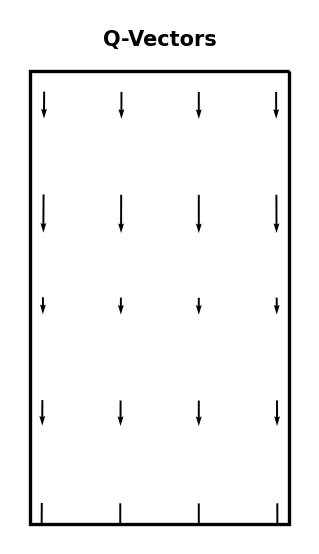

In [4]:
import matplotlib.pyplot as plt
import cartopy.crs as crs
import cartopy.feature as cfeature
%matplotlib inline

# Create a small figure.
fig = plt.figure(figsize=(2,2), dpi=300)

# Use a Lambert conformal projection for plotting.
ax = plt.subplot(projection=crs.LambertConformal(central_longitude=-99.5, central_latitude=41.0,standard_parallels=(41.25,41.75)))

# Create spacing between vectors to make them legible.
# This option skips every other data point.
spacing = slice(None, None, 1)

# Plot the vectors.
ax.quiver(ds.longitude.values[spacing],
          ds.latitude.values[spacing],
          q_u.values[spacing, spacing],
          q_v.values[spacing, spacing],
          transform=crs.PlateCarree(),
          scale=2 * 10**-10)

# Add a descriptive title.
plt.title("Q-Vectors", weight="bold", size=5)


<br /><br />

5. We are typically interested in where Q-Vectors are converging (indicating forcing for ascent) and where the vectors are diverging (indicating forcing for descent).  We can obtain the Q-Vector divergence by using MetPy's divergence function:

In [5]:
divergence = calc.divergence(q_u, q_v)
divergence

Magnitude,[[7.693239478138778e-16 7.693239478138979e-16 7.693239478138474e-16 7.693239478137265e-16] [-1.3800483153779205e-16 -1.38004831537802e-16 -1.3800483153780697e-16 -1.3800483153780697e-16] [-1.7741854896874326e-16 -1.7741854896876313e-16 -1.7741854896871348e-16 -1.7741854896859431e-16] [5.130083312589484e-16 5.130083312589483e-16 5.130083312589483e-16 5.130083312589483e-16] [1.0654123172890413e-15 1.065412317289012e-15 1.0654123172890559e-15 1.0654123172891732e-15]]
Units,meter/(kilogram second)


<br /><br />

6. Finally, we can plot the Q-Vectors and their divergence on the same map.  Note: the Q-Vector divergence is multiplied by 10<sup>17</sup> so that the contour values are easier to interpret, and the color table is reversed so that red shading indicates ascent.

/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


Text(0.5, 1.0, 'Q-Vectors and Q-Vector Divergence ($m kg^{-1} s^{-1}$ x $10^{-17}$)')

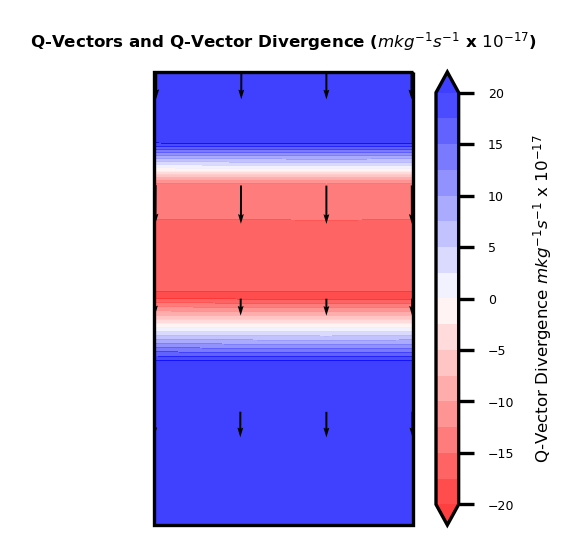

In [6]:
# Create the figure.
fig = plt.figure(figsize=(2,2), dpi=300)

# Use a Lambert conformal projection for plotting.
ax = plt.subplot(projection=crs.LambertConformal(central_longitude=-99.5, central_latitude=41.0,standard_parallels=(41.25,41.75)))

# Contour the Q-Vector divergence.
cont = ax.contourf(ds.longitude.values, ds.latitude.values, divergence.values* 10**17, np.arange(-20,22.5,2.5), cmap="bwr_r", transform=crs.PlateCarree(), extend="both", alpha=0.75)

# Create a divergence colorbar, then add a label to it and adjust the tick labels
# to be smaller (for this small plot) so they are legible.
cb = plt.colorbar(cont)
cb.set_label("Q-Vector Divergence $m kg^{-1} s^{-1}$ x $10^{-17}$", size=4)
cb.ax.tick_params(labelsize=3)

# Create spacing between vectors to make them legible.
# This option skips every other data point.
spacing = slice(None, None, 1)

# Plot the vectors.
ax.quiver(ds.longitude.values[spacing],
          ds.latitude.values[spacing],
          q_u.values[spacing, spacing],
          q_v.values[spacing, spacing],
          transform=crs.PlateCarree(),
          scale=2 * 10**-10)

# Add a descriptive title.
plt.title("Q-Vectors and Q-Vector Divergence ($m kg^{-1} s^{-1}$ x $10^{-17}$)", weight="bold", size=4)


<br /><br />

### Part II Instructions

The 1800 UTC 22 February 2023 GFS analysis has been locally downloaded for you to use with this lab.  The location of these data is provided for you below, as is the filename convention if you wish to use a datetime object to select your time of interest.

Using the downloaded GFS data, create the following maps:

<ul>
    <li>500 hPa Geopotential Height and Absolute Vorticity
    <li>925 hPa Geopotential Height and Absolute Vorticity
    <li>700 hPa Geopotential Height, Temperature, Q-Vectors, and Q-Vector Divergence
</ul>

Be sure your maps follow the "good map" guidelines, and don't forget to import the necessary packages before you start coding. Make sure that your plots incorporate the points included in the second code block below.

In [7]:
from datetime import datetime
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot, sky_cover
import numpy as np
import cartopy.crs as crs 
import cartopy
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import xarray as xr
from siphon.simplewebservice.iastate import IAStateUpperAir
import sys
from metpy.units import units
import metpy.calc as calc
import pandas as pd

In [8]:
'''
# Variable to specify datetime.
time = 

# Data location.
data_location = "/data/AtmSci360/Synp2/Lab_5/"

# Filename convention.
file_name = f"{time:%m%d%y_%H}_gfs.grib2"
'''

'\n# Variable to specify datetime.\ntime = \n\n# Data location.\ndata_location = "/data/AtmSci360/Synp2/Lab_5/"\n\n# Filename convention.\nfile_name = f"{time:%m%d%y_%H}_gfs.grib2"\n'

In [9]:
'''
ax.text(-91, 39.25, "A", size = 16, weight="bold", transform=crs.PlateCarree())
ax.text(-96, 47.5, "B", size = 16, weight="bold", transform=crs.PlateCarree())
'''

'\nax.text(-91, 39.25, "A", size = 16, weight="bold", transform=crs.PlateCarree())\nax.text(-96, 47.5, "B", size = 16, weight="bold", transform=crs.PlateCarree())\n'

In [10]:
def process_upper_air_data(time):
    data_location = "/data/AtmSci360/Synp2/Lab_5/"

    file_name = f"{time:%m%d%y_%H}_gfs.grib2"
  
    model_data = xr.open_dataset(f"{data_location}{time:%m%d%y_%H}_gfs.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})


    
    
    
    
    return model_data

In [11]:
def plot_vort_gh(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    ax.text(-91, 39.25, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-96, 47.5, "B", size = 16, weight="bold", transform=crs.PlateCarree())
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm)",size=7,weight="bold",loc="left")            
    

In [12]:
def plot_700_map(time,model_data):
    model_data=model_data.sel(isobaricInhPa=700)
   
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
    fig = plt.figure(figsize=(11,85),dpi=300)
    
    ax = plt.subplot(projection = proj)
    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
    ax.set_extent((-125, -50, 23, 60))

    
    model_data['t'].values = gaussian_filter(model_data['t'].values,3)
    model_data['u'].values = gaussian_filter(model_data['u'].values,3)
    model_data['v'].values = gaussian_filter(model_data['v'].values,3)
    
    q_u, q_v = calc.q_vector( model_data['u'], model_data['v'], model_data['t'], model_data['isobaricInhPa'])
    divergence = calc.divergence(q_u, q_v)
    contq = ax.contourf(model_data['longitude'].values, model_data['latitude'].values, divergence.values* 10**17, np.arange(-15,15,2), cmap="bwr_r", transform=crs.PlateCarree(), extend="both", alpha=0.75)

    cb = plt.colorbar(contq,shrink=0.10)
    cb.set_label(("Q-Vector Divergence $m kg^{-1} s^{-1}$ x $10^{-17}$"), size=9)
    
    spacing = slice(None, None, 4)

    ax.quiver(model_data['longitude'].values[spacing],
          model_data['latitude'].values[spacing],
          q_u.values[spacing, spacing],
          q_v.values[spacing, spacing],
          transform=crs.PlateCarree(),
          scale=3 * 10**-10)
    
    
    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    
    filtered_gh = gaussian_filter(model_data["gh"].values,2)

    cont = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_gh, np.arange(0,12000,30), linewidths = 0.7, colors='k', transform=crs.PlateCarree())
    
 
    ax.clabel(cont, cont.levels, inline=True, fmt=lambda v: format(v, '.0f')[:3], fontsize=6)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-30,38,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)
    
    
    
    ax.text(-91, 39.25, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-96, 47.5, "B", size = 16, weight="bold", transform=crs.PlateCarree())



 
    plt.title("700 Q-Vectors and Q-Vector Divergence ($m kg^{-1} s^{-1}$ x $10^{-17}$), Temperature (red | $\degree$C), and Geopotential Heights (black | dm)", size=4, weight="bold", loc="left")
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
   
    plt.show()

In [13]:
def plot_925_map(time, model_data):
    model_data=model_data.sel(isobaricInhPa=925)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,30),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
    ax.text(-91, 39.25, "A", size = 16, weight="bold", transform=crs.PlateCarree())
    ax.text(-96, 47.5, "B", size = 16, weight="bold", transform=crs.PlateCarree())

    
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 925 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

Ignoring index file '/data/AtmSci360/Synp2/Lab_5/022223_18_gfs.grib2.923a8.idx' older than GRIB file
skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.

/opt/tljh/user/lib/python3.7/site-packages/metpy/xarray.py:354: UserWarning: More than one time coordinate present for variable "u".
  + varname + '.')
/opt/tljh/user/lib/python3.7/site-packages/pint/quantity.py:1309: RuntimeWarning: invalid value encountered in true_divide
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)


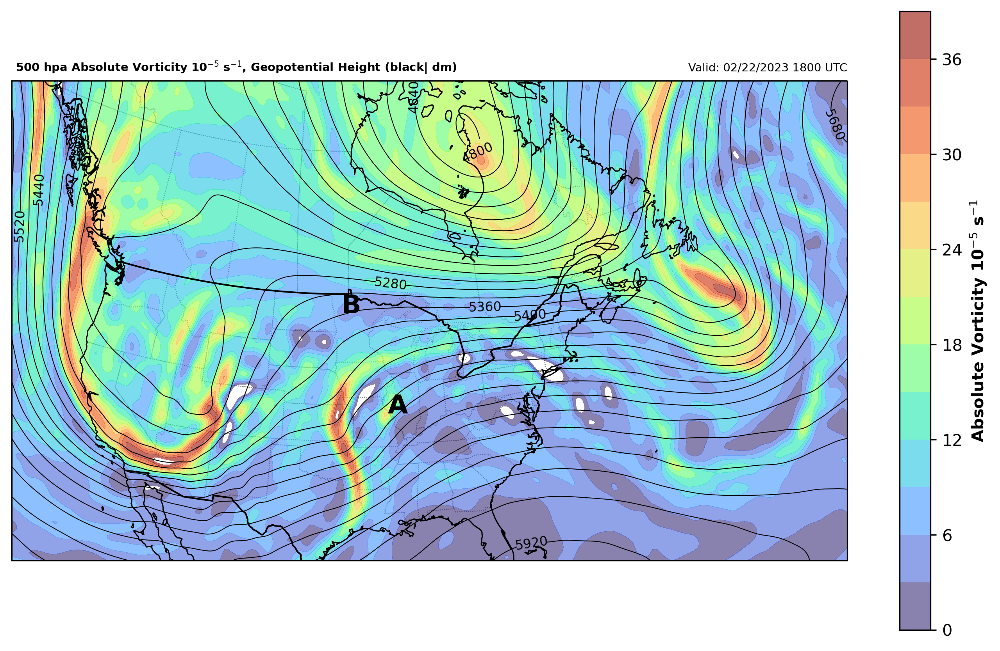

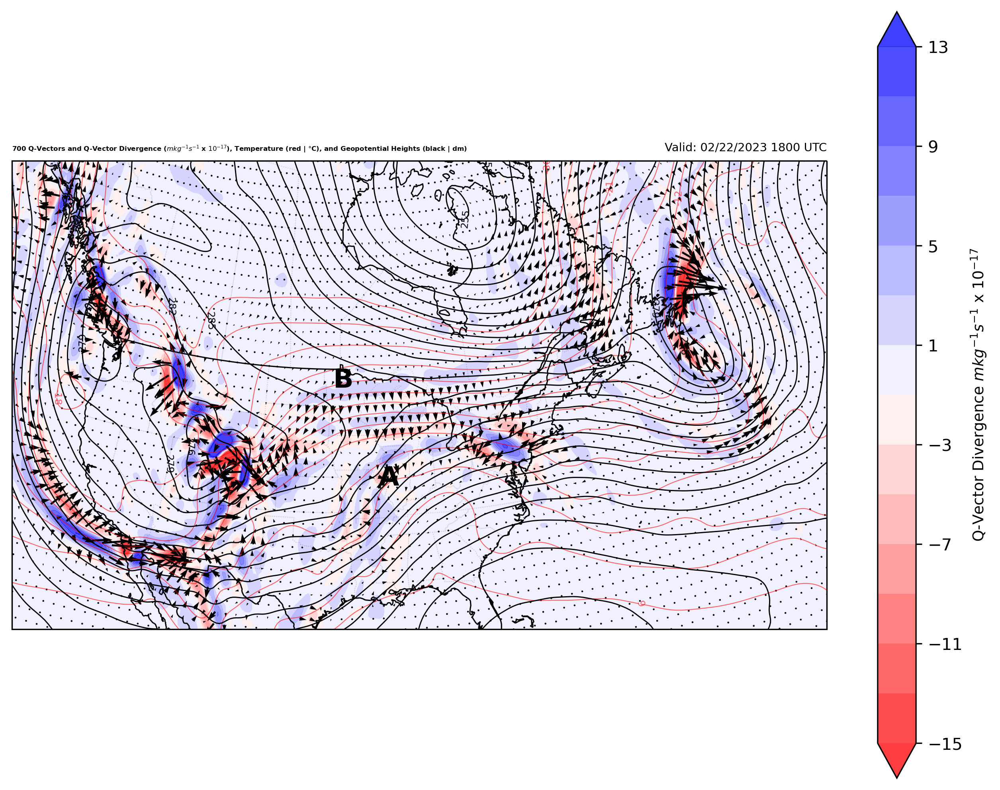

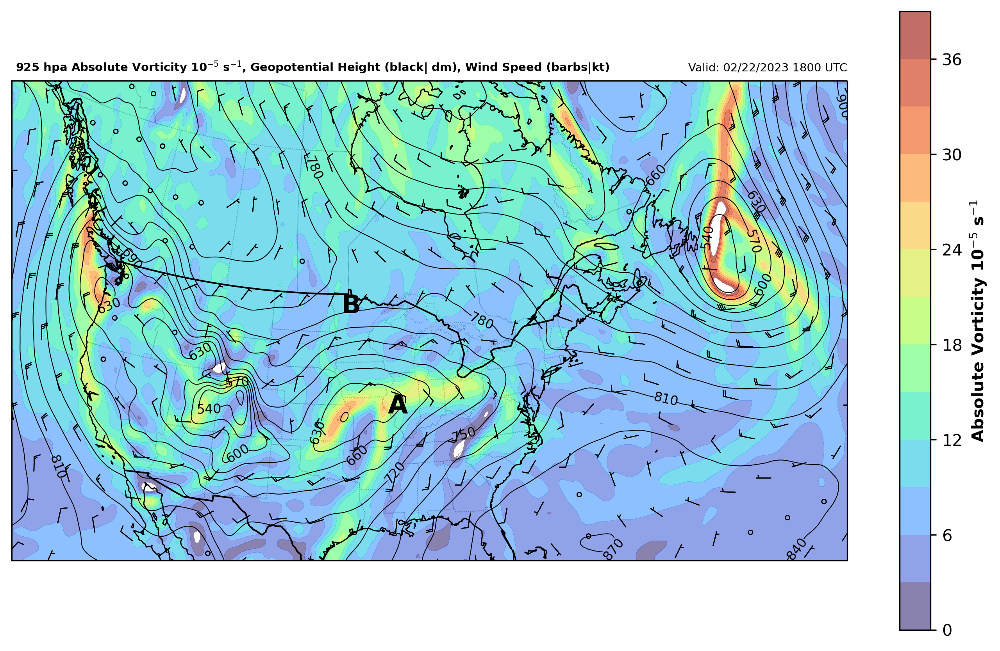

In [14]:
time=datetime(2023,2,22,18)
model_data=process_upper_air_data(time)
plot_vort_gh(time, model_data)
plot_700_map(time,model_data)
plot_925_map(time, model_data)

<br /><br />

### Part IV Instructions

So you can complete this part of the lab, GFS analyses since 1200 UTC 15 March 2023 have been locally downloaded for you to use to complete this part of the lab.  The location of these data is provided for you below, as is the filename convention if you wish to use a datetime object to select your time of interest.

Using the downloaded GFS data, create the following maps:

<ul>
    <li>500 hPa Geopotential Height and Absolute Vorticity
    <li>925 hPa Geopotential Height and Absolute Vorticity
    <li>700 hPa Geopotential Height, Temperature, Q-Vectors, and Q-Vector Divergence
</ul>

Be sure your maps follow the "good map" guidelines, and don't forget to import the necessary packages before you start coding.

In [15]:
'''
# Variable to specify datetime.
time = 

# Data location.
data_location = "/data/AtmSci360/Synp2/Lab_5/"

# Filename convention.
file_name = f"{time:%m%d%y_%H}_gfs.grib2"
'''

'\n# Variable to specify datetime.\ntime = \n\n# Data location.\ndata_location = "/data/AtmSci360/Synp2/Lab_5/"\n\n# Filename convention.\nfile_name = f"{time:%m%d%y_%H}_gfs.grib2"\n'

In [16]:
def process_upper_air_data2(time):
    data_location = "/data/AtmSci360/Synp2/Lab_5/"
    file_name = f"{time:%m%d%y_%H}_gfs.grib2"
  
    model_data = xr.open_dataset(f"{data_location}{time:%m%d%y_%H}_gfs.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})

    
    
    return model_data

In [17]:
def plot_real_500(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm)",size=7,weight="bold",loc="left")            
    

In [18]:
def plot_real_700(time,model_data):
    model_data=model_data.sel(isobaricInhPa=700)
   
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
    fig = plt.figure(figsize=(11,85),dpi=300)
    
    ax = plt.subplot(projection = proj)
    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
    ax.set_extent((-125, -50, 23, 60))

    
    model_data['t'].values = gaussian_filter(model_data['t'].values,3)
    model_data['u'].values = gaussian_filter(model_data['u'].values,3)
    model_data['v'].values = gaussian_filter(model_data['v'].values,3)
    
    q_u, q_v = calc.q_vector( model_data['u'], model_data['v'], model_data['t'], model_data['isobaricInhPa'])
    divergence = calc.divergence(q_u, q_v)
    contq = ax.contourf(model_data['longitude'].values, model_data['latitude'].values, divergence.values* 10**17, np.arange(-15,15,2), cmap="bwr_r", transform=crs.PlateCarree(), extend="both", alpha=0.75)

    cb = plt.colorbar(contq,shrink=0.10)
    cb.set_label(("Q-Vector Divergence $m kg^{-1} s^{-1}$ x $10^{-17}$"), size=9)
    
    spacing = slice(None, None, 4)

    ax.quiver(model_data['longitude'].values[spacing],
          model_data['latitude'].values[spacing],
          q_u.values[spacing, spacing],
          q_v.values[spacing, spacing],
          transform=crs.PlateCarree(),
          scale=3 * 10**-10)
    
    
    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    
    filtered_gh = gaussian_filter(model_data["gh"].values,2)

    cont = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_gh, np.arange(0,12000,30), linewidths = 0.7, colors='k', transform=crs.PlateCarree())
    
 
    ax.clabel(cont, cont.levels, inline=True, fmt=lambda v: format(v, '.0f')[:3], fontsize=6)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-30,38,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)


 
    plt.title("700 Q-Vectors and Q-Vector Divergence ($m kg^{-1} s^{-1}$ x $10^{-17}$), Temperature (red | $\degree$C), and Geopotential Heights (black | dm)", size=4, weight="bold", loc="left")
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
   
    plt.show()

In [19]:
def plot_real_925(time, model_data):
    model_data=model_data.sel(isobaricInhPa=925)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -50, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,30),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    

    
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 925 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

Can't create file '/data/AtmSci360/Synp2/Lab_5/031623_18_gfs.grib2.923a8.idx'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 534, in from_indexpath_or_filestream
    with compat_create_exclusive(indexpath) as new_index_file:
  File "/opt/tljh/user/lib/python3.7/contextlib.py", line 112, in __enter__
    return next(self.gen)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 500, in compat_create_exclusive
    fd = os.open(path, os.O_WRONLY | os.O_CREAT | os.O_EXCL)
PermissionError: [Errno 13] Permission denied: '/data/AtmSci360/Synp2/Lab_5/031623_18_gfs.grib2.923a8.idx'
Can't read index file '/data/AtmSci360/Synp2/Lab_5/031623_18_gfs.grib2.923a8.idx'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/messages.py", line 544, in from_indexpath_or_filestream
    index_mtime = os.path.getmtime(indexpath)
  File "/opt/tljh/user/lib/python3.7/genericpath.py", 

/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:836: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:836: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:982: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings.extend(multi_line_string)
/opt/tljh/user/lib/python3.7/site-packages/cartopy/crs.py:982: ShapelyDeprecatio

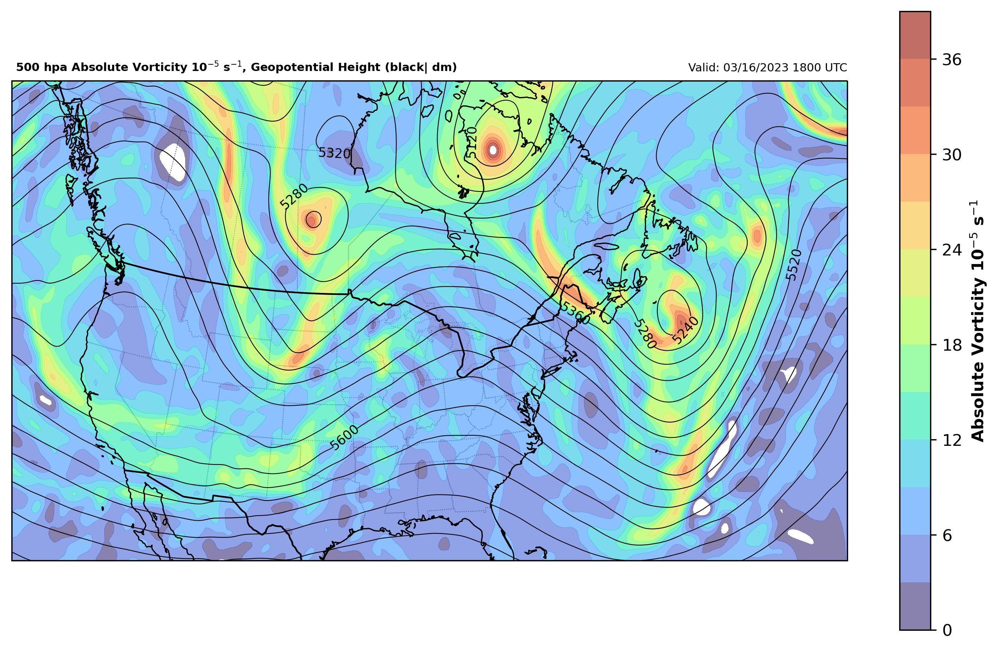

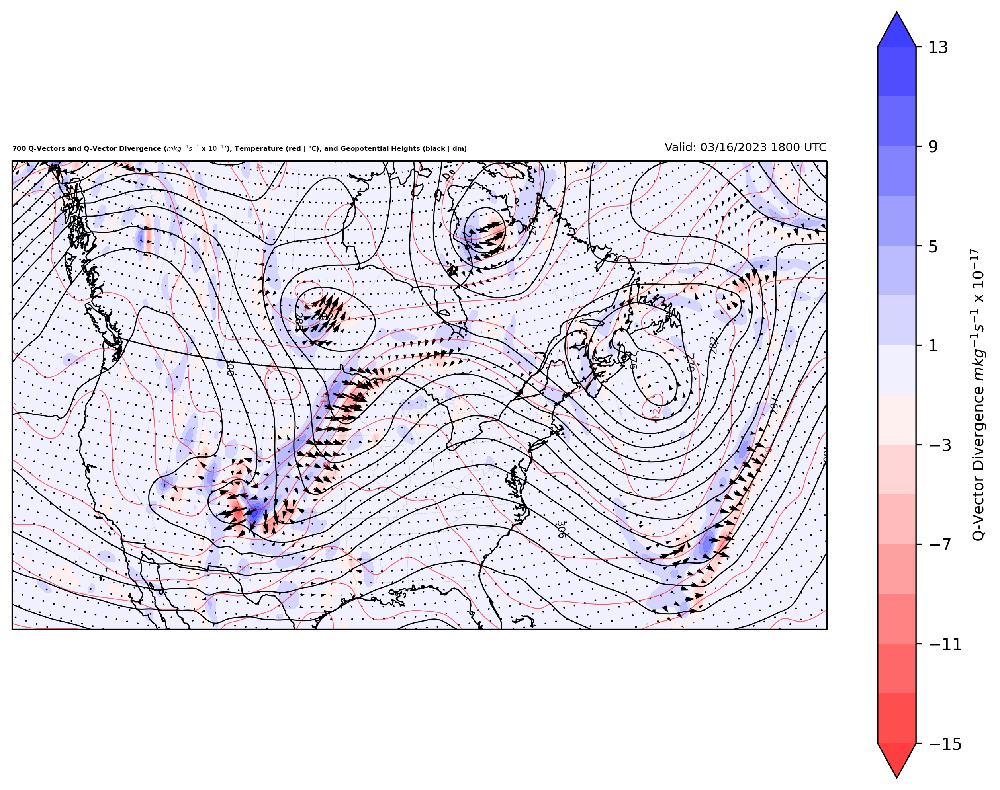

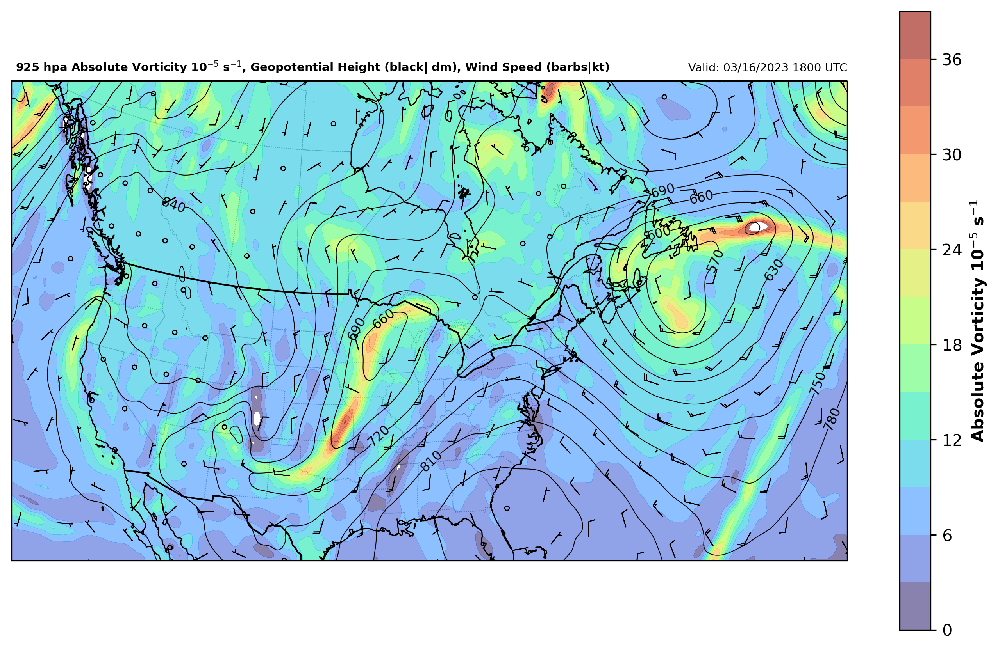

In [20]:
time=datetime(2023,3,16,18)
model_data=process_upper_air_data2(time)
plot_real_500(time, model_data)
plot_real_700(time,model_data)
plot_real_925(time,model_data)